In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities

# Comparison between Flows and Connection algorithms for 2014-2018 matrices 

## Flows


In [2]:
label1 = "Table3_Reduced_matrix_2014_2018_flows"
reduced_matrix_2014_2018_flows = pd.read_csv("../data/"+label1+".csv", index_col=0)

sub_matrix_2014_2018_flows = reduced_matrix_2014_2018_flows[reduced_matrix_2014_2018_flows['weight']<1.0].sort_values(by=['weight'], ascending=False)
sub_matrix_2014_2018_flows = sub_matrix_2014_2018_flows[sub_matrix_2014_2018_flows['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2014_2018_flows.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018_flows['StartIndst'].values,sub_matrix_2014_2018_flows['FinalIndst'].values])))
sub_matrix_2014_2018_flows.head()

Number of links: 555.0
Number of 4-digit industries observed:
220


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2105,4212,3317,0.999604,"Railways, underground railways",Transport equipment nec,Civil engineering,Repair/installation excl. household,Construction (including development of real es...,Machinery repair excluding motor vehicles,10.0
1976,2399,2363,0.999586,Non-metallic mineral nec,Ready-mixed concrete,Other non-metallic mineral products,"Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
2030,4636,1082,0.999552,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2149,147,1091,0.999500,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2166,3317,4212,0.999500,Transport equipment nec,"Railways, underground railways",Repair/installation excl. household,Civil engineering,Machinery repair excluding motor vehicles,Construction (including development of real es...,16.0


## Connections


In [3]:
label2 = "Table4_Reduced_matrix_2014_2018_connections"
reduced_matrix_2014_2018_conn = pd.read_csv("../data/"+label2+".csv", index_col=0)

sub_matrix_2014_2018_conn = reduced_matrix_2014_2018_conn[reduced_matrix_2014_2018_conn['weight']<1]
sub_matrix_2014_2018_conn = sub_matrix_2014_2018_conn[sub_matrix_2014_2018_conn['weight']>0]

print ("Number of links:", sub_matrix_2014_2018_conn.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018_conn['StartIndst'].values,sub_matrix_2014_2018_conn['FinalIndst'].values])))

sub_matrix_2014_2018_conn.sort_values(by=['weight'], ascending=False).head()



Number of links: 702.0
Number of 4-digit industries observed:
230


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2395,1091,147,0.999598,Prepared farm animals feeds,Raising of poultry,Food products - other,"Animal production, hunting","Manufacture food, drink, tobacco","Agriculture, Forestry, Fishing, Veterinary",11.0
2458,147,1091,0.999598,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2474,1082,4636,0.999488,"Cocoa, choc, sugar confectionery","Sugar, chocolate",Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",25.0
2350,4636,1082,0.999488,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2269,2399,2363,0.999398,Non-metallic mineral nec,Ready-mixed concrete,Other non-metallic mineral products,"Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0


In [4]:
Gm_simple_2014_2018_flows = build_network_object(reduced_matrix_2014_2018_flows,'weight')
Gm_simple_2014_2018_conn = build_network_object(reduced_matrix_2014_2018_conn,'weight')

## Degree comparison:

NETWORK OF flows


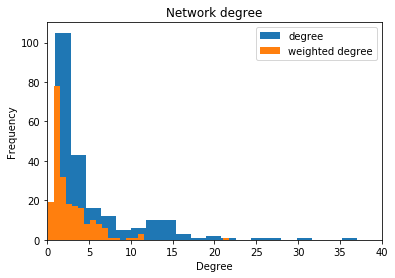

mean degree 5.390909090909091
mean strenght 2.7114018585506816


NETWORK OF connections


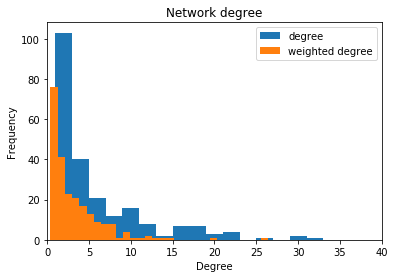

mean degree 6.104347826086957
mean strenght 3.3250012990964497


In [5]:
print ('NETWORK OF flows')
compare_degrees_strength(Gm_simple_2014_2018_flows)
print()
print()
print ('NETWORK OF connections')
compare_degrees_strength(Gm_simple_2014_2018_conn)

## Adjacency matrix:
### Flows:

In [6]:
draw_adjacency_matrix(reduced_matrix_2014_2018_flows,['StartIndst','FinalIndst'],'weight')

### Connections:

In [7]:
draw_adjacency_matrix(reduced_matrix_2014_2018_conn,['StartIndst','FinalIndst'],'weight')

# Network visualisation: by main industry

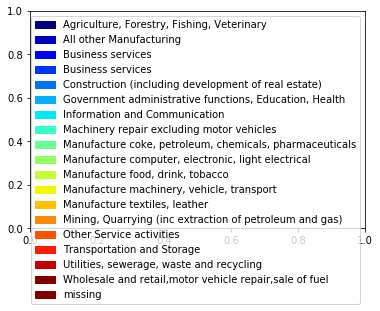

0

In [8]:
draw_network_by_classification(Gm_simple_2014_2018_flows,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2013_flows/network_industry.png)


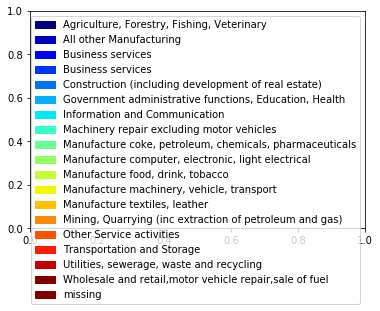

0

In [9]:
draw_network_by_classification(Gm_simple_2014_2018_conn,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_industry.png)


## Network visualisation: by community
## Flows:

In [10]:
network_components_2014_2018_flows = Gm_simple_2014_2018_flows.components()
network_largest_2014_2018_flows = network_components_2014_2018_flows.subgraphs()[0]


In [11]:
net_community_2014_2018_flows = network_largest_2014_2018_flows.community_multilevel(weights=network_largest_2014_2018_flows.es['weight'])
print ('Modularity',net_community_2014_2018_flows.modularity)

Modularity 0.6523232852507371


In [12]:
draw_and_print_communities(network_largest_2014_2018_flows,net_community_2014_2018_flows,'../img/'+label1+'/network_community.png')

Community : 1
['Temporary employment agencies', 'Other non-specialised', 'Other', 'Bread, cakes, confectionery', 'Non-specialised wholesale trade', 'Bread; pastry goods, cakes', 'Defence activities', 'Non-hazardous waste collection', 'Accounting, auditing; tax consltcy', 'Road freight transport', 'Warehousing and storage', 'Other', 'Pharmaceutical preparations', 'Pharmaceutical goods', 'Employment placement agencies', 'Other support activities', 'Other', 'Other', 'Poultry meat processing, preserving', 'Other plastic', 'Prepared meals and dishes', 'Motor vehicle other parts', 'Other', 'Plastic plates, sheets, tubes etc', 'Fruit and vegetables', 'Meat, poultry meat production', 'Chemical products', 'Packaging activities', 'Electric lighting equipment', 'Other fruit, vegetable', 'Other food products nec', 'Fish processing, preserving', 'Meat processing, preserving', 'Other natural sciences, engineering', 'Beverages', 'Social sciences, humanities', 'Grain mill products', 'Rusks, biscuits; 

## Connections:



In [13]:
network_components_2014_2018_conn = Gm_simple_2014_2018_conn.components()
network_largest_2014_2018_conn = network_components_2014_2018_conn.subgraphs()[0]
net_community_2014_2018_conn = network_largest_2014_2018_conn.community_multilevel(weights=network_largest_2014_2018_conn.es['weight'])
print ('Modularity',net_community_2014_2018_conn.modularity)

Modularity 0.6093126267719118


In [14]:
draw_and_print_communities(network_largest_2014_2018_conn,net_community_2014_2018_conn,'../img/'+label2+'/network_community.png')

Community : 1
['Tertiary', 'General public administration', 'Primary', 'General secondary', 'Technical, vocational secondary', 'Other education nec', 'Religious organisations', 'Post-secondary non-tertiary', 'Educational support activities', 'Library and archive activities', 'Other natural sciences, engineering', 'Pharmaceutical preparations', 'Pharmaceutical goods', 'Fire service activities', 'Compulsory social security activities', 'Defence activities', 'missing', 'Museum activities', 'Social sciences, humanities']

Community : 2
['Dispensing chemist', 'Dental practices', 'Other nec', 'Other amusement, recreation', 'Restaurants, mobile food service', 'Food, beverages, tobacco mainly', 'Clothing', 'Beverage serving', 'Other non specialised', 'Gambling, betting activities', 'Under universal service obligation', 'Hardware, paints, glass', 'Hairdressing, beauty treatment', 'Other new goods', 'Furniture, lighting, other', 'Water collection, treatment, supply', 'Watches, jewellery', 'Via m

### Flows:

!['something here'](../img/Table3_Reduced_matrix_2014_2018_flows/network_community.png)


### Connections:


![title](../img/Table4_Reduced_matrix_2014_2018_connections/network_community.png)
